## Color Clustering

In [313]:
# Import Libraries
import os

import pandas as pd
import numpy as np

from sklearn.metrics import confusion_matrix, accuracy_score

from PIL import Image
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

In [335]:
# Set Other Configs
warnings.filterwarnings(action="ignore")

pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

In [3]:
# Set Path Variables
ROOT_PATH = os.getcwd()
DATA_PATH = os.path.join(ROOT_PATH, "data")

In [4]:
# Create Dataset with Images

# Renkler
colors = ['red', 'blue', 'green', 'gray', 'white']

# Boş bir DataFrame oluştur
df_data = pd.DataFrame(columns=['FileName', 'FilePath', 'Color'])

for color in colors:
    color_path = os.path.join(DATA_PATH, 'roboflow', color)

    # Renk altındaki dosyaları al
    files = os.listdir(color_path)

    # DataFrame'e eklemek için veriyi oluştur
    data = {'FilePath':color_path, 'FileName': files, 'Color': color,}

    # DataFrame'e ekle
    df_data = pd.concat([df_data, pd.DataFrame(data)], ignore_index=True)

df_data['FilePath'] = df_data['FilePath'] + str('\\') + df_data['FileName']

In [5]:
df_data

,FileName,FilePath,Color
0,original1.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original1.jpg,red
1,original10.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original10.jpg,red
2,original11.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original11.jpg,red
3,original12.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original12.jpg,red
4,original13.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original13.jpg,red
...,...,...,...
95,original5.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original5.jpg,white
96,original6.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original6.jpg,white
97,original7.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original7.jpg,white
98,original8.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original8.jpg,white


In [6]:
file_names = df_data['FilePath'].to_list()
file_names[0:5]

['C:\\Users\\metin\\Desktop\\YTU\\2-BLM5110-ML\\Homeworks\\blm5110_hw2-clustering\\data\\roboflow\\red\\original1.jpg',
 'C:\\Users\\metin\\Desktop\\YTU\\2-BLM5110-ML\\Homeworks\\blm5110_hw2-clustering\\data\\roboflow\\red\\original10.jpg',
 'C:\\Users\\metin\\Desktop\\YTU\\2-BLM5110-ML\\Homeworks\\blm5110_hw2-clustering\\data\\roboflow\\red\\original11.jpg',
 'C:\\Users\\metin\\Desktop\\YTU\\2-BLM5110-ML\\Homeworks\\blm5110_hw2-clustering\\data\\roboflow\\red\\original12.jpg',
 'C:\\Users\\metin\\Desktop\\YTU\\2-BLM5110-ML\\Homeworks\\blm5110_hw2-clustering\\data\\roboflow\\red\\original13.jpg']

### Task 1: Create Image to Array

**Description:** `Resimlerin formatını hazır kütüphaneler kullanarak çözerek görüntüye ait matrisi elde ediniz.Bir görüntü piksellerin (R,G,B) bileşenlerinden oluştuğu bir matristir.` 

In [7]:
def create_img_to_arr(img_path_list):
    img_rgb_arr = []
    img_bgr_arr = []

    for file in img_path_list:
        img_bgr = cv2.imread(file)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        red, green, blue = cv2.split(img_rgb)
        # red, green, blue
        
        height, width, channels = img_rgb.shape
        # height, width, channels

        img_rgb_arr.append(img_rgb)
        img_bgr_arr.append(img_bgr)

    return img_rgb_arr, img_bgr_arr

In [8]:
img_rgb_arr, img_bgr_arr = create_img_to_arr(img_path_list=file_names)

### Task 2: Create Color Histogram for each R,G,B Components and Chart

**Description:** `Resimleri oluşturan piksellerin (R,G,B) değerlerine göre her resmin renk histogramını (Her resimde R, G, B bileşenleri için ayrı ayrı olmak üzere toplam 3 histogram) elde ediniz. Histogram eldesi için 
de hazır kütüphane kullanabilirsiniz. Bir pikselin R,G,B bileşenlerinin değeri 0-255 arası değişti 
için her histogram dizisi 256 elemanlı olmalıdı.` 

In [9]:
def img_to_hist_arr(img_arr, is_rgb=True):       
    hist_r_arr = []
    hist_g_arr = []
    hist_b_arr = []
    
    for i in range(0, len(img_arr)):
        img = img_arr[i]
        height, width, channels = img.shape
        
        if is_rgb:
            hist_r = cv2.calcHist([img], [0], None, [256], [0, 256]).ravel()
            hist_g = cv2.calcHist([img], [1], None, [256], [0, 256]).ravel()
            hist_b = cv2.calcHist([img], [2], None, [256], [0, 256]).ravel()
        else:
            hist_r = cv2.calcHist([img], [2], None, [256], [0, 256]).ravel()
            hist_g = cv2.calcHist([img], [1], None, [256], [0, 256]).ravel()
            hist_b = cv2.calcHist([img], [0], None, [256], [0, 256]).ravel()

        hist_r_arr.append(hist_r)
        hist_g_arr.append(hist_g)
        hist_b_arr.append(hist_b)

    return hist_r_arr, hist_g_arr, hist_b_arr

In [10]:
hist_r_arr, hist_g_arr, hist_b_arr = img_to_hist_arr(img_arr=img_rgb_arr, is_rgb=True)

In [11]:
# hist_r_arr, hist_g_arr, hist_b_arr

#### Plot Histograms RGB Components

In [12]:
def plot_histogram(hist_r_arr, hist_g_arr, hist_b_arr, normalized_msg=""):

    for i in range(0, len(hist_r_arr)):
        hist_r = hist_r_arr[i]
        hist_g = hist_g_arr[i]
        hist_b = hist_b_arr[i]

        plt.figure(figsize=(25, 3))
        plt.subplot(131)
        plt.plot(hist_r, color='red')
        plt.title(f'Red Channel {normalized_msg} Histogram', size=8, loc='left')
        plt.xlim([0, 256])
        
        plt.subplot(132)
        plt.plot(hist_g, color='green')
        plt.title(f'Green Channel {normalized_msg}Histogram', size=8, loc='left')
        plt.xlim([0, 256])
        
        plt.subplot(133)
        plt.plot(hist_b, color='blue')
        plt.title(f'Blue Channel {normalized_msg}Histogram',size=8, loc='left')
        plt.xlim([0, 256])
        
        plt.suptitle(f'Image {i+1} {normalized_msg} Histograms', size=10)
        plt.show()

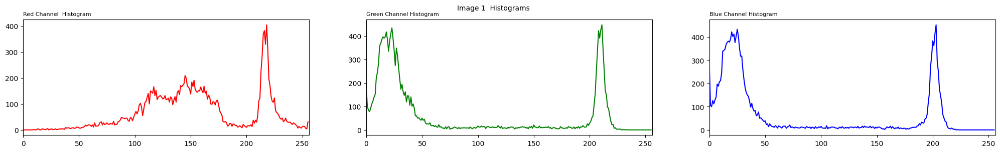

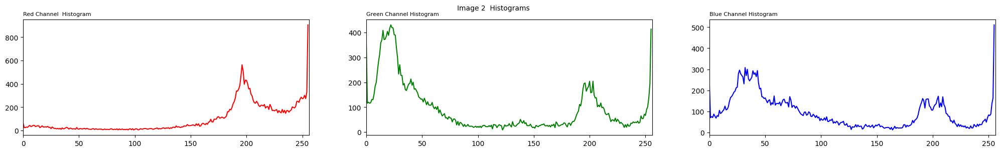

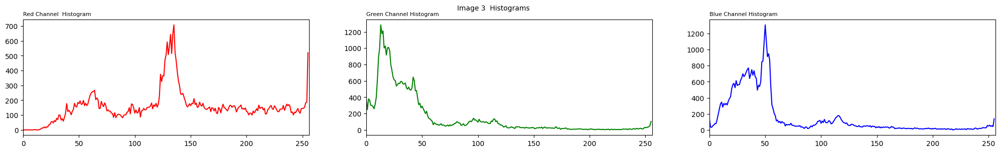

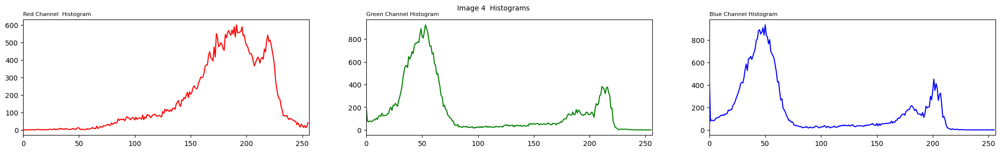

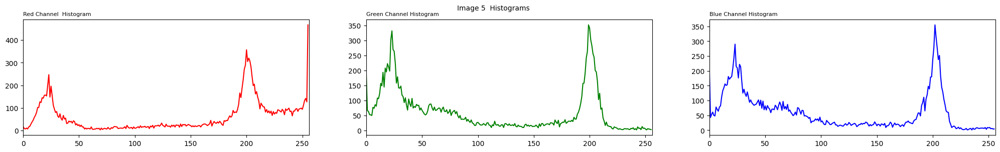

...

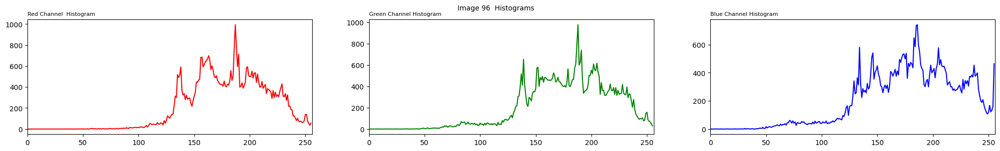

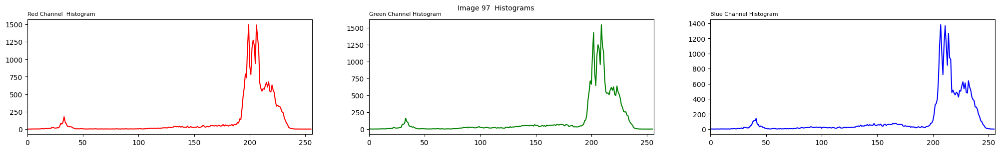

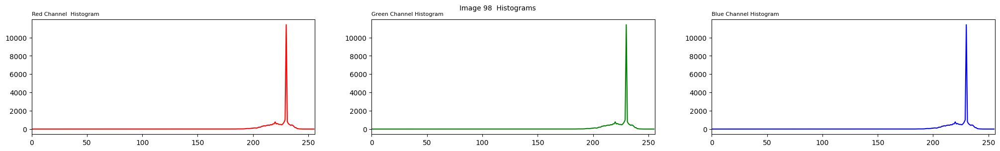

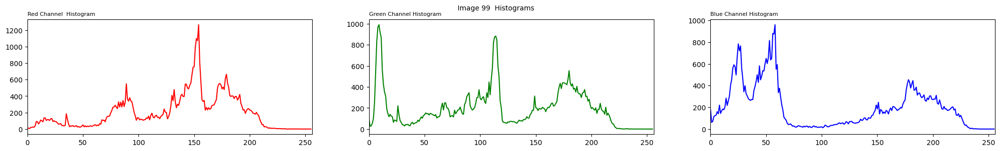

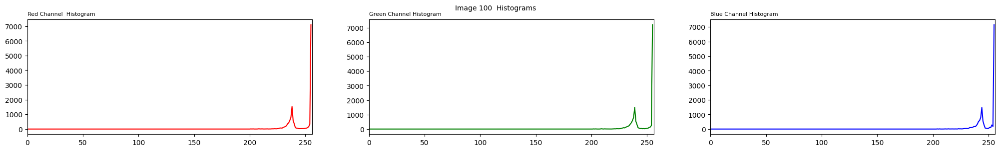

In [13]:
plot_histogram(hist_r_arr, hist_g_arr, hist_b_arr)

### Task 3: Normalizing Color Histogram for each R,G,B Components

**Description:** `Her resimde, her renk bileşeni için histogram dizisindeki sonuçları resimdeki toplam piksel 
sayısına bölerek dizi elemanlarının değerini [0-1] aralığına normalize ediniz` 

In [14]:
def img_to_norm_hist_arr(img_arr, is_rgb=True):
    norm_hist_r_arr = []
    norm_hist_g_arr = []
    norm_hist_b_arr = []
    
    for i in range(0, len(img_arr)):
        img = img_arr[i]
        height, width, channels = img.shape
        
        if is_rgb:
            hist_r = cv2.calcHist([img], [0], None, [256], [0, 256]).ravel()
            hist_g = cv2.calcHist([img], [1], None, [256], [0, 256]).ravel()
            hist_b = cv2.calcHist([img], [2], None, [256], [0, 256]).ravel()
        else:
            hist_r = cv2.calcHist([img], [2], None, [256], [0, 256]).ravel()
            hist_g = cv2.calcHist([img], [1], None, [256], [0, 256]).ravel()
            hist_b = cv2.calcHist([img], [0], None, [256], [0, 256]).ravel()
        
        total_pixel = height * width
        norm_hist_r_arr.append(hist_r / total_pixel)
        norm_hist_g_arr.append(hist_g / total_pixel)
        norm_hist_b_arr.append(hist_b / total_pixel)
    
    return norm_hist_r_arr, norm_hist_g_arr, norm_hist_b_arr

In [15]:
norm_hist_r_arr, norm_hist_g_arr, norm_hist_b_arr = img_to_norm_hist_arr(img_arr=img_rgb_arr, is_rgb=True)

#### Histogram vs Normalized Histogram Chart

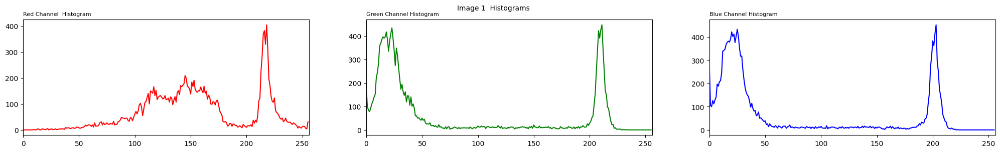

In [16]:
plot_histogram(hist_r_arr[0:1], hist_g_arr[0:1], hist_b_arr[0:1], normalized_msg="")

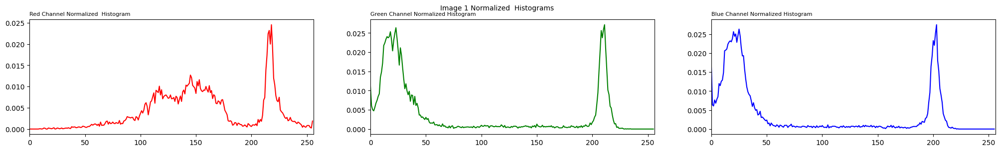

In [17]:
plot_histogram(norm_hist_r_arr[0:1], norm_hist_g_arr[0:1], norm_hist_b_arr[0:1], normalized_msg="Normalized ")

### Task 4: K Means Algorithms for k=5

**Description:** `Resimlerin histogramlarını benzerliklerine göre k=5 değeri için(5 renk sınıfı olduğu için) k-means
yöntemiyle kümeleyiniz. K-means’de başlangıç adımında rasgele seçeceğiniz k resmin
histogramını k cluster’ın başlangıç merkezi olarak kullanınız.`

In [18]:
# norm_hist_r_arr, norm_hist_g_arr, norm_hist_b_arr
histograms = np.array([np.concatenate((r, g, b)) for r, g, b in zip(norm_hist_r_arr, norm_hist_g_arr, norm_hist_b_arr)])

#### KMeans Algorithms

In [138]:
class KMeans:
    def __init__(self, n_clusters=5, max_iters=100, distance_metric='euclidean'):
        self.n_clusters = n_clusters
        self.max_iters = max_iters
        self.distance_metric = distance_metric
        self.centroids = None
        self.clusters = None
        

    def initialize_centroids(self, X):
        centroids_indices = np.random.choice(X.shape[0], self.n_clusters, replace=False)
        centroids = X[centroids_indices]
        return centroids

    def calculate_distance(self, x, y):
        # Uzaklık hesaplama (Öklid veya Manhattan)
        if self.distance_metric == 'euclidean':
            return np.dot(x - y, x - y)
        elif self.distance_metric == 'manhattan':
            return np.sum(np.abs(x - y))
        else:
            raise ValueError("Geçersiz uzaklık metriği. 'euclidean' veya 'manhattan' seçiniz.")

    def fit(self, X):
        self.centroids = self.initialize_centroids(X)

        for _ in range(self.max_iters):
            # Atama aşaması
            self.clusters = np.array([np.argmin([self.calculate_distance(x, y) for y in self.centroids]) for x in X])

            # Güncelleme aşaması
            new_centroids = np.array([X[self.clusters == k].mean(axis=0) for k in range(self.n_clusters)])

            # Eğer merkezler değişmiyorsa döngüyü bitir
            if np.all(self.centroids == new_centroids):
                print("Cluster Converged")
                break

            self.centroids = new_centroids

    def predict(self, X):
        return np.array([np.argmin([self.calculate_distance(x, y) for y in self.centroids]) for x in X])

In [171]:
# # KMeans sınıfını oluştur
kmeans = KMeans(n_clusters=5, max_iters=150, distance_metric='euclidean')

# # Veriyi kümele
kmeans.fit(histograms)

# # Kümeleme sonuçları
clusters = kmeans.predict(histograms)
print(clusters)

Cluster Converged
[1 0 1 0 0 1 1 1 1 1 0 0 1 2 1 1 1 1 4 1 0 0 2 0 0 0 4 0 4 0 0 0 0 0 0 0 0
 0 0 0 0 0 4 0 2 0 2 0 0 0 0 2 0 0 0 2 0 0 0 2 0 4 3 4 0 4 4 0 4 0 4 4 0 0
 4 0 4 0 4 4 0 2 0 1 0 0 1 3 0 0 0 3 0 0 0 0 0 3 0 2]


In [172]:
# for i, cluster in enumerate(clusters):
#     print(f"Resim {i+1} -> Küme {cluster}")

In [173]:
df_data['ClusterId'] = clusters
df_data

,FileName,FilePath,Color,ClusterId
0,original1.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original1.jpg,red,1
1,original10.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original10.jpg,red,0
2,original11.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original11.jpg,red,1
3,original12.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original12.jpg,red,0
4,original13.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original13.jpg,red,0
...,...,...,...,...
95,original5.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original5.jpg,white,0
96,original6.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original6.jpg,white,0
97,original7.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original7.jpg,white,3
98,original8.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original8.jpg,white,0


#### Evaluations

##### Count for each ClusterId

In [174]:
df_data.groupby(by=['ClusterId'], as_index=False).agg(Cnt=('ClusterId', 'count'))

,ClusterId,Cnt
0,0,57
1,1,15
2,2,9
3,3,4
4,4,15


##### Count for each ClusterId and Color

In [175]:
df_data.groupby(by=['ClusterId', 'Color'], as_index=False).agg(Cnt=('ClusterId', 'count')).sort_values(by=['Cnt'], ascending=False)

,ClusterId,Color,Cnt
0,0,blue,17
2,0,green,14
4,0,white,13
5,1,red,13
14,4,gray,11
1,0,gray,8
8,2,green,5
3,0,red,5
12,3,white,3
6,1,white,2


#### Cluster Performance Evaluation

In [354]:
def cluster_evaluate(df, label_1="", label_2="", labels=[], visualise=False):
    accuracy = accuracy_score(df[label_1], df[label_2])
    print(f"Accuracy: {accuracy}")
    if visualise:
        conf_matrix = confusion_matrix(df[label_1], df[label_2], labels=labels)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['red', 'blue', 'green', 'white', 'gray'], yticklabels=['red', 'blue', 'green', 'white', 'gray'])
        plt.xlabel('Tahmin Edilen Renk')
        plt.ylabel('Gerçek Renk')
        plt.title('Confusion Matrix')
        plt.show()

#### Visualize for each ClusterId

In [160]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

def display_images(image_paths, images_per_row):
    num_images = len(image_paths)
    num_rows = int(np.ceil(num_images / images_per_row))

    plt.figure(figsize=(15, 3 * num_rows))  # Figür boyutunu ayarlama
    for i, image_path in enumerate(image_paths):
        # img = mpimg.imread(image_path)  # Görseli yükleme
        img = cv2.imread(image_path)  # Görseli yükleme
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(num_rows, images_per_row, i + 1)  # Satır satır ve belirlenen sayıda sütunda i+1. görseli ayarlama
        plt.imshow(img)
        f = str(image_path.split("\\")[-2:][0]) + str("-") + str(image_path.split("\\")[-2:][1])
        plt.title(f'{f}', size=8, loc='center')
        plt.axis('off')  # Eksenleri kapatma

    plt.tight_layout()  # Layout'u düzenleme
    plt.show()

Cluster Id:0 & Color:blue


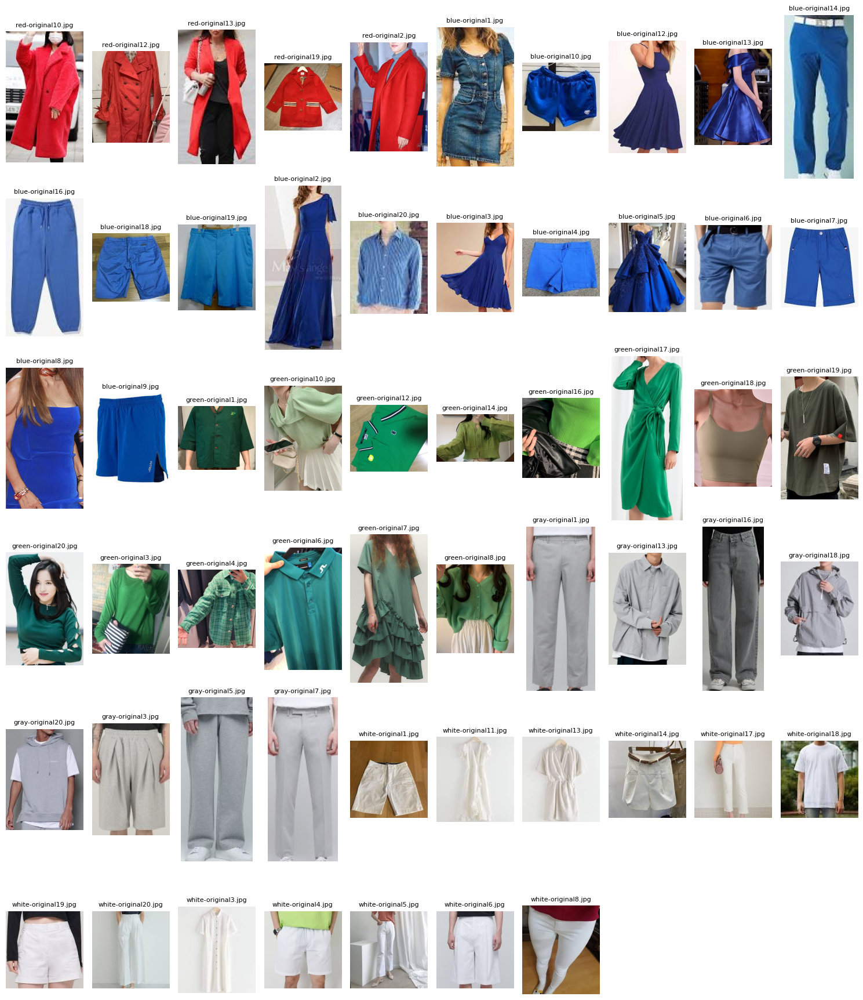

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:1 & Color:red


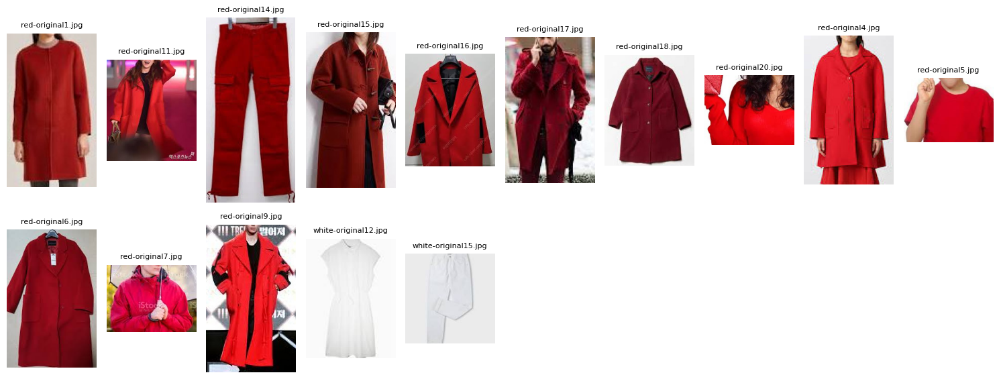

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:2 & Color:green


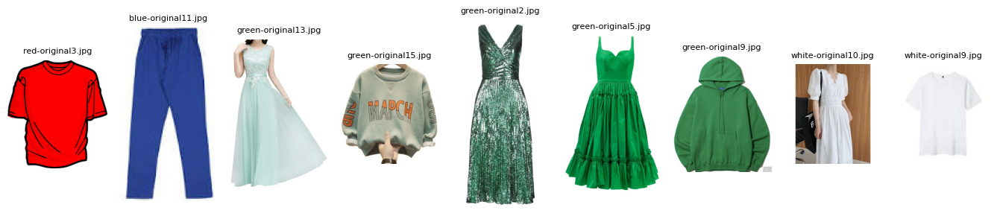

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:3 & Color:white


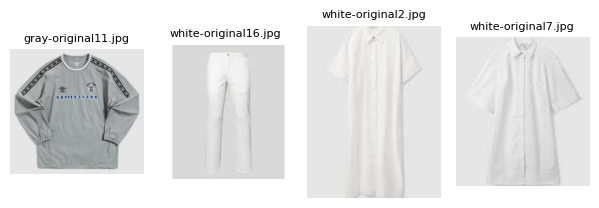

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:4 & Color:gray


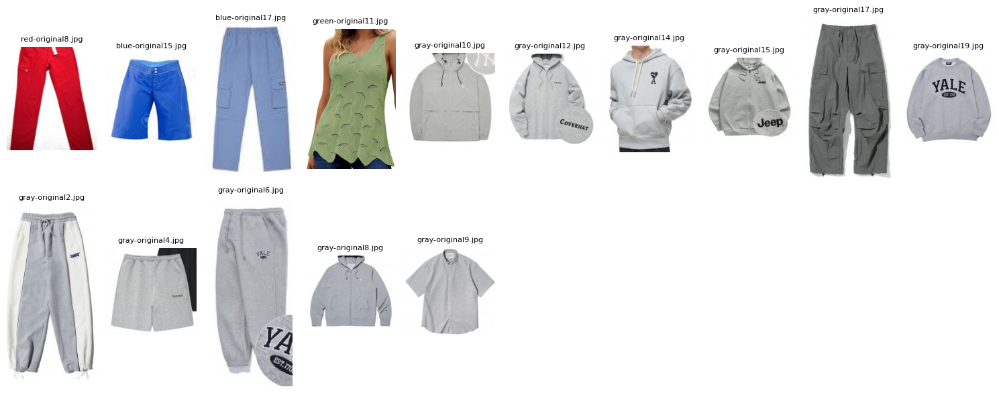

= = = = = = = = = = = = = = = = = = = = = = = = = 


In [310]:
cluster_color_dict = df_evaluate[['ClusterId', 'ClusterColor']].drop_duplicates().sort_values(by=['ClusterId'], ascending=True).reset_index(drop=True).to_dict()['ClusterColor']    
for i in range(0, 5):
    color_name = cluster_color_dict[i]
    print("Cluster Id:{} & Color:{}".format(i, color_name))
    # image_paths = ['resim{}.jpg'.format(i) for i in range(1, 101)]  # örnek isimler
    image_paths = df_data[df_data['ClusterId']==i]['FilePath'].to_list()
    
    X = 10  # Her satırdaki resim sayısı
    display_images(image_paths, X)
    print("= " * 25)

### Task : Deneysel Sonuçlar

#### 10 Tekrar ile Kümeleme Performansının Ölçülmesi

**a.** `Küme merkezlerini rasgele belirleyerek her k değeri için kümeleme işlemini 10 defa tekrarlayınız. Her kümeleme sonunda, kümelerde doğru cluster’da olan resim yüzdesini hesaplayınız.`

In [352]:
# df_cluster_result = pd.DataFrame()
df_cluster_result = df_data[['FileName', 'FilePath','Color']]
for i in range(0, 10):
    kmeans = KMeans(n_clusters=5, max_iters=150)
    kmeans.fit(histograms)
    clusters = kmeans.predict(histograms)
    df_cluster_result[f'ClusterId_{i+1}'] = clusters

df_cluster_result

Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged
Cluster Converged


,FileName,FilePath,Color,ClusterId_1,ClusterId_2,ClusterId_3,ClusterId_4,ClusterId_5,ClusterId_6,ClusterId_7,ClusterId_8,ClusterId_9,ClusterId_10
0,original1.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original1.jpg,red,1,4,4,0,4,0,0,2,4,0
1,original10.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original10.jpg,red,1,4,4,0,4,0,0,2,4,0
2,original11.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original11.jpg,red,1,4,4,0,4,0,0,2,4,0
3,original12.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original12.jpg,red,1,4,2,0,4,4,0,2,4,0
4,original13.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original13.jpg,red,1,4,4,0,4,4,0,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,original5.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original5.jpg,white,1,4,2,0,4,4,0,2,4,0
96,original6.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original6.jpg,white,1,4,2,0,4,4,0,2,4,0
97,original7.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original7.jpg,white,3,3,1,1,2,3,3,3,1,3
98,original8.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original8.jpg,white,1,4,2,0,4,4,0,2,4,0


In [357]:
for i in range(0, 10):
    df_multi_cluster = df_cluster_result.groupby(by=[f'ClusterId_{i+1}'], as_index=False)['Color'].apply(lambda x: x.value_counts().idxmax())
    df_multi_cluster.rename(columns={'Color':f'ClusterColor_{i+1}'}, inplace=True)
    df_cluster_result[f'ClusterColor_{i+1}'] = df_cluster_result[f'ClusterId_{i+1}'].map(df_multi_cluster.to_dict()[f'ClusterColor_{i+1}'])
    print(f"Cluster_{i+1}")
    cluster_evaluate(df=df_cluster_result, label_1="Color", label_2=f"ClusterColor_{i+1}", labels=['red', 'blue', 'green', 'white', 'gray'], visualise=False)
    print("* " * 10)

Cluster_1
Accuracy: 0.54
* * * * * * * * * * 
Cluster_2
Accuracy: 0.38
* * * * * * * * * * 
Cluster_3
Accuracy: 0.5
* * * * * * * * * * 
Cluster_4
Accuracy: 0.37
* * * * * * * * * * 
Cluster_5
Accuracy: 0.33
* * * * * * * * * * 
Cluster_6
Accuracy: 0.49
* * * * * * * * * * 
Cluster_7
Accuracy: 0.38
* * * * * * * * * * 
Cluster_8
Accuracy: 0.32
* * * * * * * * * * 
Cluster_9
Accuracy: 0.38
* * * * * * * * * * 
Cluster_10
Accuracy: 0.33
* * * * * * * * * * 


Cluster_1
Accuracy: 0.54


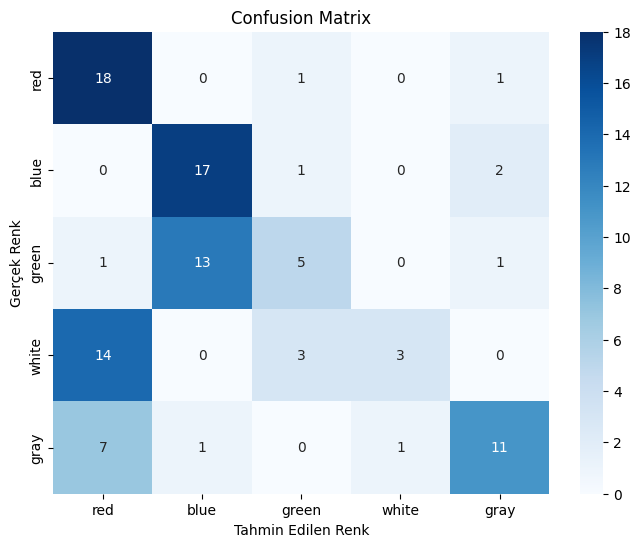

* * * * * * * * * * 
Cluster_2
Accuracy: 0.38


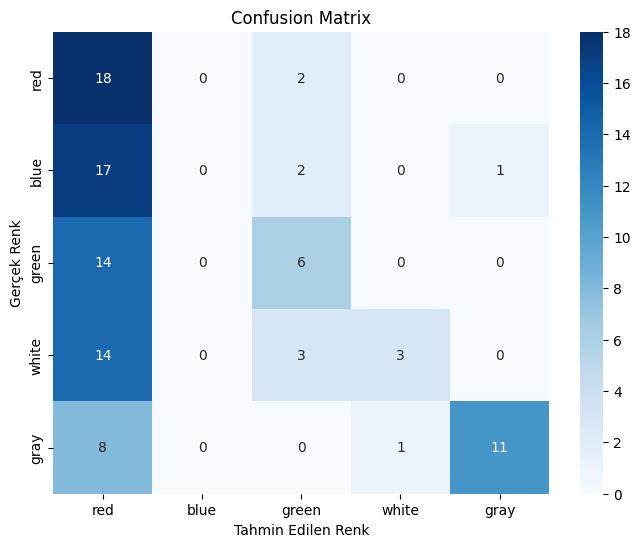

* * * * * * * * * * 
Cluster_3
Accuracy: 0.5


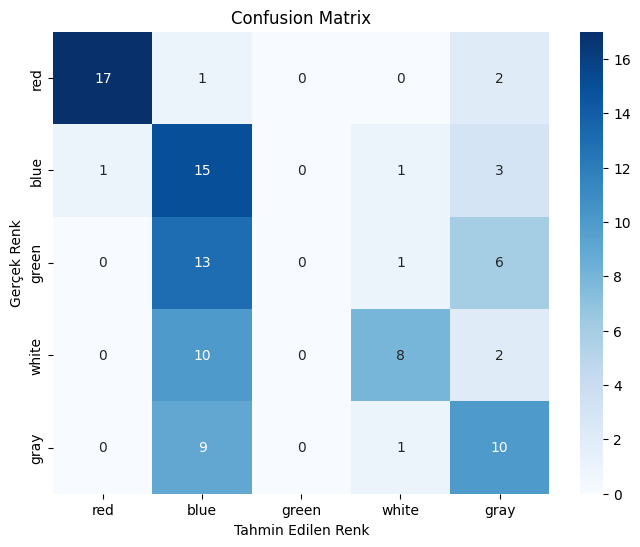

* * * * * * * * * * 
Cluster_4
Accuracy: 0.37


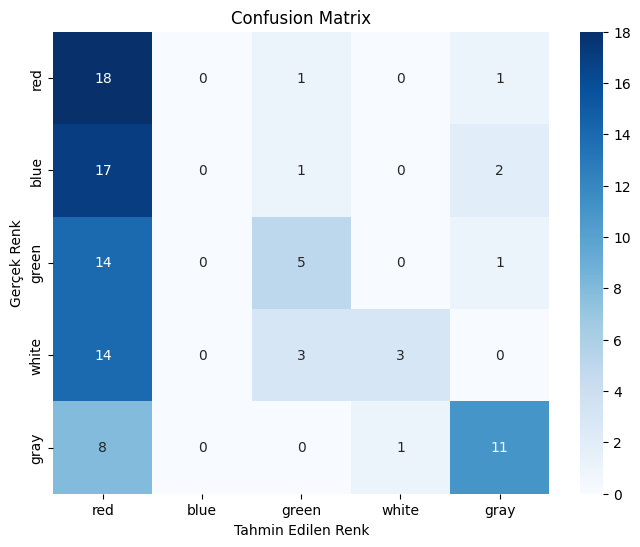

* * * * * * * * * * 
Cluster_5
Accuracy: 0.33


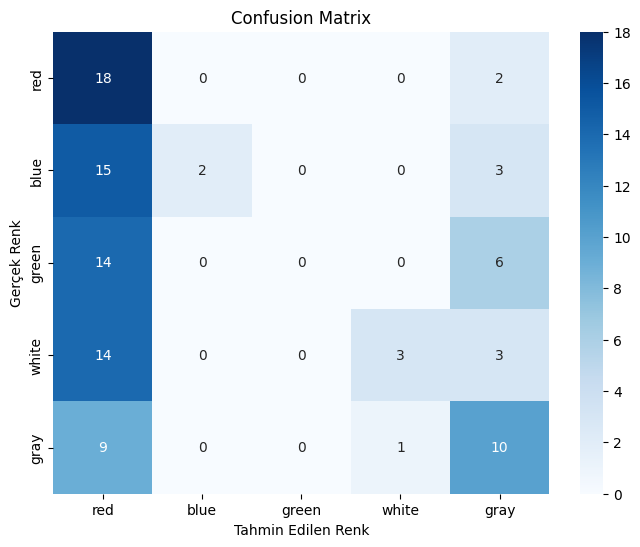

* * * * * * * * * * 
Cluster_6
Accuracy: 0.49


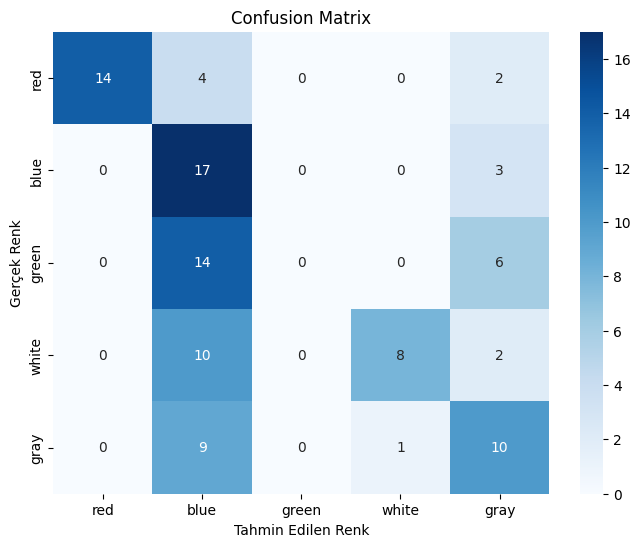

* * * * * * * * * * 
Cluster_7
Accuracy: 0.38


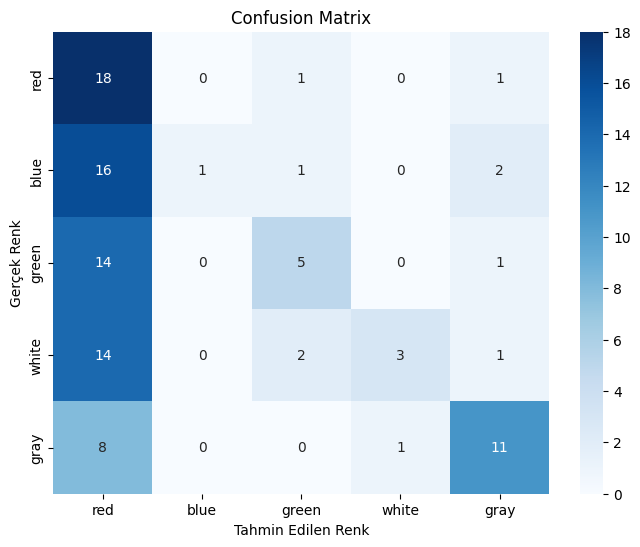

* * * * * * * * * * 
Cluster_8
Accuracy: 0.32


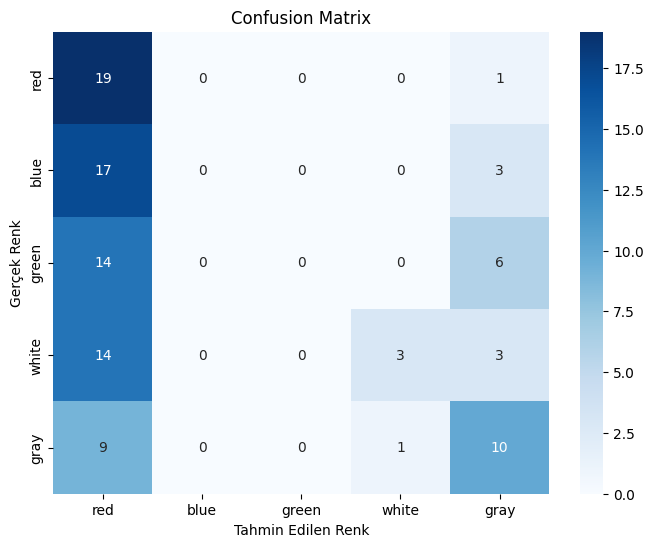

* * * * * * * * * * 
Cluster_9
Accuracy: 0.38


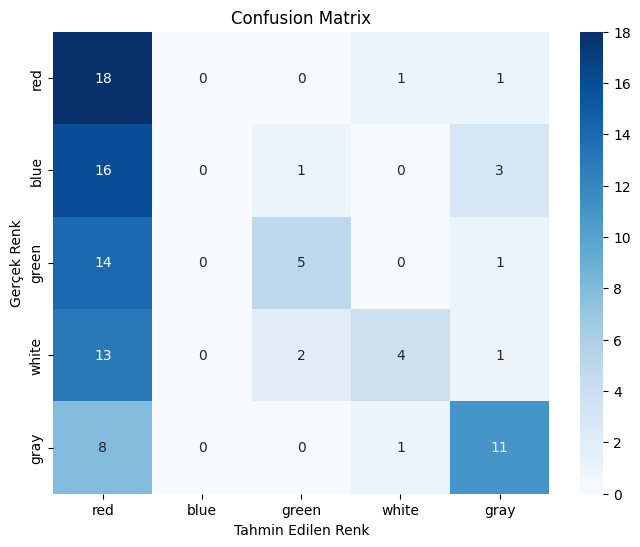

* * * * * * * * * * 
Cluster_10
Accuracy: 0.33


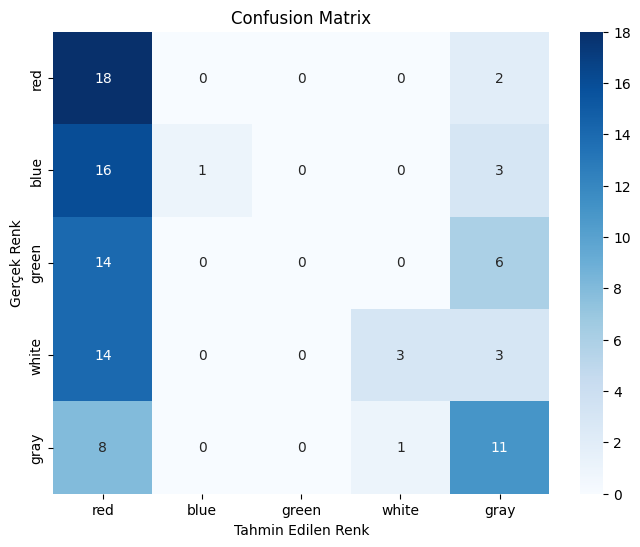

* * * * * * * * * * 


In [358]:
for i in range(0, 10):
    df_multi_cluster = df_cluster_result.groupby(by=[f'ClusterId_{i+1}'], as_index=False)['Color'].apply(lambda x: x.value_counts().idxmax())
    df_multi_cluster.rename(columns={'Color':f'ClusterColor_{i+1}'}, inplace=True)
    df_cluster_result[f'ClusterColor_{i+1}'] = df_cluster_result[f'ClusterId_{i+1}'].map(df_multi_cluster.to_dict()[f'ClusterColor_{i+1}'])
    print(f"Cluster_{i+1}")
    cluster_evaluate(df=df_cluster_result, label_1="Color", label_2=f"ClusterColor_{i+1}", labels=['red', 'blue', 'green', 'white', 'gray'], visualise=True)
    print("* " * 10)

#### Cluster Performansının Ölçülmesi

**b.** `Hazırlayacağınız karışıklık matrisi (confusion matrix) üzerinde sonucu gösteriniz`

In [245]:
df_cluster = df_data.groupby(by=['ClusterId'], as_index=False)['Color'].apply(lambda x: x.value_counts().idxmax())
df_cluster.rename(columns={'Color':'ClusterColor'}, inplace=True)
df_cluster

,ClusterId,ClusterColor
0,0,blue
1,1,red
2,2,green
3,3,white
4,4,gray


In [254]:
df_evaluate = pd.merge(df_data, df_cluster, on='ClusterId', how='left')
df_evaluate

,FileName,FilePath,Color,ClusterId,ClusterColor
0,original1.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original1.jpg,red,1,red
1,original10.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original10.jpg,red,0,blue
2,original11.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original11.jpg,red,1,red
3,original12.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original12.jpg,red,0,blue
4,original13.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\red\original13.jpg,red,0,blue
...,...,...,...,...,...
95,original5.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original5.jpg,white,0,blue
96,original6.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original6.jpg,white,0,blue
97,original7.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original7.jpg,white,3,white
98,original8.jpg,C:\Users\metin\Desktop\YTU\2-BLM5110-ML\Homeworks\blm5110_hw2-clustering\data\roboflow\white\original8.jpg,white,0,blue


Accuracy: 0.49


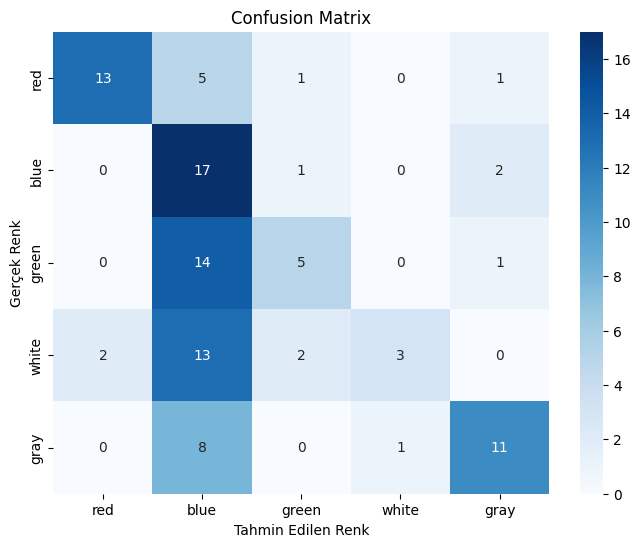

In [338]:
cluster_evaluate(df=df_evaluate, label_1="Color", label_2="ClusterColor", labels=['red', 'blue', 'green', 'white', 'gray'], visualise=True)

#### Doğru ve Yanlış Clusterların Görselleştirilmesi

**c.** `Her sınıf için doğru cluster’a yerleşmiş 5 örnek ve yanlış cluster’da bulunan 1 örnek resmi 
veriniz.`

Cluster Id:0 & Color:blue


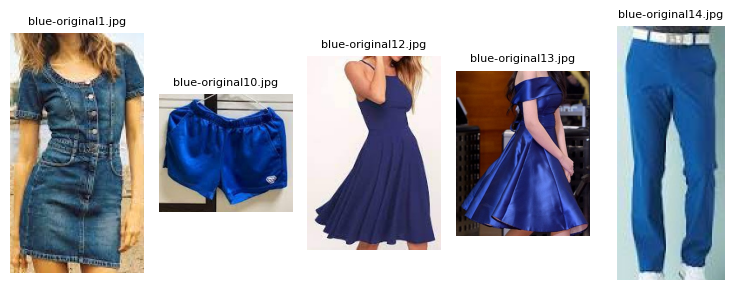

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:1 & Color:red


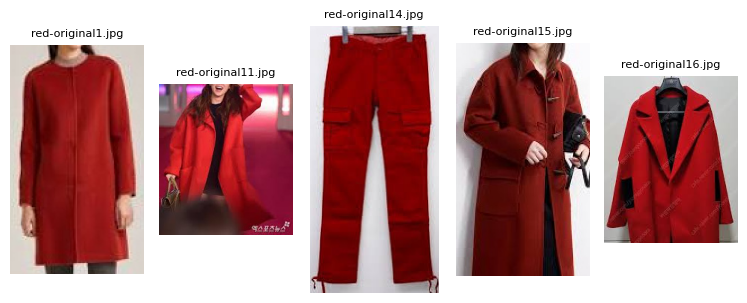

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:2 & Color:green


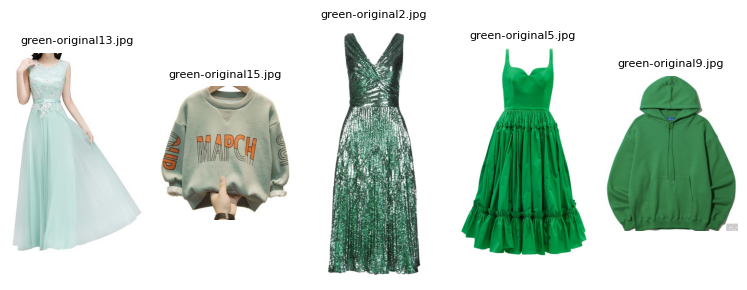

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:3 & Color:white


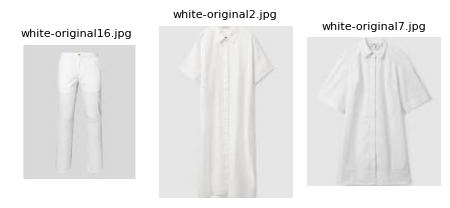

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:4 & Color:gray


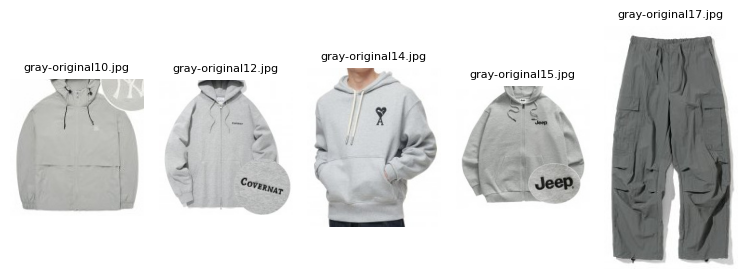

= = = = = = = = = = = = = = = = = = = = = = = = = 


In [307]:
# Doğru Yerleşmiş Örnekler
cluster_color_dict = df_evaluate[['ClusterId', 'ClusterColor']].drop_duplicates().sort_values(by=['ClusterId'], ascending=True).reset_index(drop=True).to_dict()['ClusterColor']
for i in range(0, 5):
    color_name = cluster_color_dict[i]
    print("Cluster Id:{} & Color:{}".format(i, color_name))
    image_paths = df_evaluate[(df_evaluate['ClusterId']==i) & (df_evaluate['Color']==df_evaluate['ClusterColor'])]['FilePath'].head(5).to_list()
    
    X = 10  # Her satırdaki resim sayısı
    display_images(image_paths, X)
    print("= " * 25)

Cluster Id:0 & Color:blue


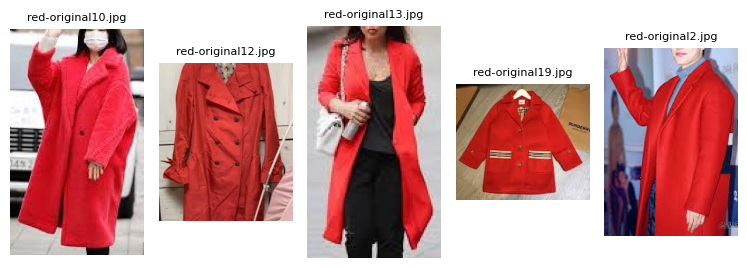

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:1 & Color:red


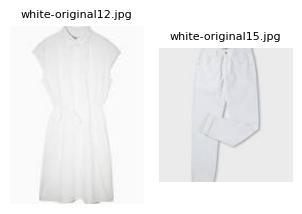

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:2 & Color:green


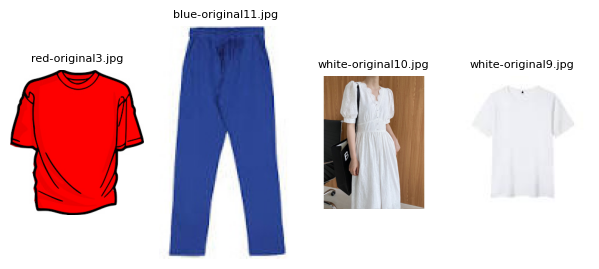

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:3 & Color:white


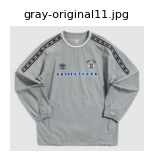

= = = = = = = = = = = = = = = = = = = = = = = = = 
Cluster Id:4 & Color:gray


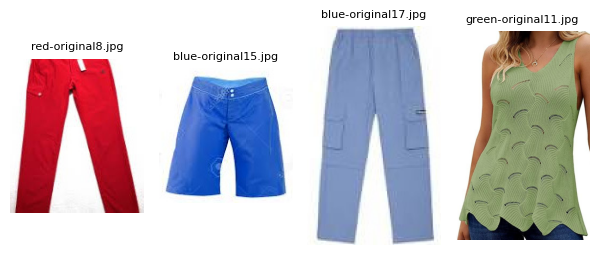

= = = = = = = = = = = = = = = = = = = = = = = = = 


In [309]:
# Yanlış Yerleşmiş Örnekler
cluster_color_dict = df_evaluate[['ClusterId', 'ClusterColor']].drop_duplicates().sort_values(by=['ClusterId'], ascending=True).reset_index(drop=True).to_dict()['ClusterColor']
for i in range(0, 5):
    color_name = cluster_color_dict[i]
    print("Cluster Id:{} & Color:{}".format(i, color_name))
    image_paths = df_evaluate[(df_evaluate['ClusterId']==i) & (df_evaluate['Color']!=df_evaluate['ClusterColor'])]['FilePath'].head(5).to_list()
    
    X = 10  # Her satırdaki resim sayısı
    display_images(image_paths, X)
    print("= " * 25)